# Trabalho de Implementação

## INF2912 - Otimização Combinatória
### Prof. Marcus Vinicius Soledade Poggi de Aragão
### 2015-2

### Ciro Cavani
#### BigData / Globo.com

Algoritmos de clusterização.

## Conteúdo

Esse notebook tem as seguintes seções:

1. [Generator](#1.-Generator)

    Algoritmo para gerar _dataset_ baseado no código Python feito pelo Poggi.
    
    Na descrição do trabalho está definido como o _dataset_ é formado. Cada grupo tem um conjunto de _features_ próprias com uma probabilidade de ativação maior do que as _features_ livres.
    <br/><br/>

2. [Visualização](#2.-Visualization)

    Formas de apresentar o _dataset_ na forma de gráfico bidimensional.
    
    Foram testadas três algoritmos: norma das partes superior e inferior do vetor de _features_ (recomendado em aula); norma das _features do grupo_ contra as _features_ livres, e; Principal Component Analysis (PCA) para redução de dimensões.
    
    Os dois primeiros não apresentam muita diferenciação entre os pontos dos grupos. O PCA funciona bem (boa separação) com 3 ou 4 grupos, mas fica com sobreposição para 5+.
    <br/><br/>

3. [Avaliação](#3.-Evaluation)

    Métricas para avaliação de algoritmos de clusterização.
    
    É implementado um algoritmo de clusterização aleatório ponderado. A partir desse algoritmo, é calculada a matriz de confusão, Accuracy, Precision, Recall e etc.
    <br/><br/>

4. [Exportação](#4.-Export-/-Load)

    Geração de datasets a serem usados para o desenvolvimento dos algoritmos desse trabalho.

## 1. Generator

Problema:

Propor um classificador que identifique o grupo de cada objeto.

Dados:

* $g$: número de grupos diferentes
* $n$: número de objetos (não necessariamente diferentes)
* $n_{min}$: número mínimo de objetos em um grupo
* $n_{max}$: número máximo de objetos em um grupo

Para cada Objeto:

* $c$: número de características binárias
* $c_y$: número de características de um determinado grupo
* $c_n$: número de características dos demais grupos ($c_n = c_y (g - 1)$)
* $p$: probabilidade de ativação das características de um grupo ($p > 0.5$)
* $1 - p$: probabilidade de ativação das características dos demais grupos
* $p' = 0.5$: probabilidade de ativação das características que não são de qualquer grupo
* (as características de cada grupo não tem interseção)

In [1]:
"gera a distribuição de objetos para os grupos"
function group_size(g, n, n_min, n_max)
    num_g = Array(Int, g)
    sum = 0
    for i=1:g
        num_g[i] = rand(n_min:n_max)
        sum += num_g[i]
    end
    correct = n / sum
    sum = 0
    for i=1:g
        num_g[i] = round(Int, num_g[i] * correct)
        sum += num_g[i]
    end
    if sum != n
        num_g[g] += n - sum
    end
    num_g
end

group_size (generic function with 1 method)

In [2]:
let n = 20,
    n_min = 2,
    n_max = 5,
    g = 5
    
    group_size(g, n, n_min, n_max)
end

5-element Array{Int64,1}:
 4
 2
 5
 5
 4

In [3]:
let n = 1000000,
    n_min = Int(n/2) - Int(n/10),
    n_max = Int(n/2) + Int(n/10),
    g = 5
    
    sizes = group_size(g, n, n_min, n_max)
    _n = sum(sizes)
    println(sizes)
    println(_n)
    sleep(0.2)
end

[218209,227095,168952,163071,222673]
1000000


In [4]:
"máscara de características para cada grupo sem interseção"
function group_mask(g, c, c_y)
    char_g = fill(-1, c)
    index = 1
    for i=1:g, j=1:c_y
        char_g[index] = i
        index += 1
    end
    char_g
end

group_mask (generic function with 1 method)

In [5]:
let g = 5,
    c = 16,
    c_y = 3
    
    group_mask(g, c, c_y)
end

16-element Array{Int64,1}:
  1
  1
  1
  2
  2
  2
  3
  3
  3
  4
  4
  4
  5
  5
  5
 -1

In [6]:
"""gera objetos para grupos seguindo a distribuição num_g,
a máscara char_g e a probabilidade p de ativação"""
function generate_data(num_g, char_g, p)
    data = Array(Tuple{Array{Int,1},Int}, 0)
    for i=1:length(num_g),j=1:num_g[i]
        vect = zeros(Int, length(char_g))
        for k=1:length(vect)
            if char_g[k] == i
                vect[k] = rand() < p ? 1 : 0
            elseif char_g[k] != -1
                vect[k] = rand() < 1 - p ? 1 : 0
            else
                vect[k] = rand() < 0.5 ? 1 : 0
            end
        end
        push!(data, (vect, i))
    end
    data
end

generate_data (generic function with 1 method)

In [7]:
"gerador de instâncias para o problema de clusterização"
function instance_generator(n, c, c_y, p, g, n_min, n_max)
    if c < g * c_y
        error("c_y too big")
    end
    
    num_g = group_size(g, n, n_min, n_max)
    char_g = group_mask(g, c, c_y)
    data = generate_data(num_g, char_g, p)
    data
end

instance_generator (generic function with 1 method)

In [8]:
let n = 20,
    n_min = 2,
    n_max = 5,
    g = 5,
    c = 16,
    c_y = 3,
    p = 0.8
    
    instance_generator(n, c, c_y, p, g, n_min, n_max)
end

20-element Array{Tuple{Array{Int64,1},Int64},1}:
 ([1,1,1,0,1,0,0,0,0,0,1,1,0,0,0,1],1)
 ([1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0],1)
 ([1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1],1)
 ([1,1,1,0,0,0,0,0,1,0,1,0,1,0,0,0],1)
 ([0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0],2)
 ([0,0,1,1,1,1,1,0,0,0,1,0,0,0,0,0],2)
 ([0,0,0,1,1,1,0,1,0,1,0,0,1,0,0,1],2)
 ([0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0],2)
 ([0,0,0,1,1,0,1,1,1,0,1,0,1,0,0,1],3)
 ([0,0,0,1,0,0,1,1,1,0,0,1,1,0,0,0],3)
 ([0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0],3)
 ([0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0],3)
 ([0,0,0,1,0,0,1,1,1,0,0,1,0,0,0,1],3)
 ([0,0,0,1,0,1,1,0,0,1,1,1,0,1,0,1],4)
 ([0,1,1,0,1,0,0,0,0,0,1,1,0,0,0,0],4)
 ([0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,1],4)
 ([0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0],4)
 ([0,0,0,0,1,0,0,1,0,1,0,1,1,1,1,1],5)
 ([0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,1],5)
 ([0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0],5)

In [9]:
type Dataset
    groups::Int
    features::Int
    slot::Int
    activation_p::Float64
    size::Int
    size_min::Int
    size_max::Int
    data::Array{Tuple{Array{Int,1}, Int}, 1}
    
    Dataset(; groups=3, size=10000, size_min=0, size_max=0, features=200, slot=40, activation_p=0.8) = begin
        if size < 10
            error("minimum 10")
        end
        if groups > size
            error("too many groups")
        end
        if features < groups * slot
            error("slot too big")
        end
    
        if size_max == 0
            size_max = round(Int, 1.2 * size / groups)
        end
        if size_min == 0
            size_min = round(Int, size_max / 2)
        end
        if size_max * groups < size
            error("size_max too tight")
        end
    
        data = instance_generator(size, features, slot, activation_p, groups, size_min, size_max)
        shuffle!(data)
        
        new(groups, features, slot, activation_p, size, size_min, size_max, data)
    end
end

data(ds, k) = filter(t -> t[2] == k, ds.data)
count(ds, k) = length(data(ds, k))

"Sumário do Dataset"
function summary(io::IO, ds::Dataset)
    println(io, "Number of Groups: ", ds.groups)
    println(io, "Number of Features: ", ds.features)
    println(io, "Number of Features (group): ", ds.slot)
    println(io, "Probability of Activation: ", ds.activation_p)
    println(io, "Number of Objects (total): ", ds.size)
    println(io, "Number of Objects per Group (min): ", ds.size_min)
    println(io, "Number of Objects per Group (max): ", ds.size_max)

    for k=1:ds.groups
        println(io, "Number of Objects in ", k, ": ", count(ds, k))
    end
end

"Sumário do Dataset"
summary(ds::Dataset) = summary(STDOUT, ds)
    
let _dataset = Dataset()
    summary(_dataset)
    sleep(0.2)
end

Number of Groups: 3
Number of Features: 200
Number of Features (group): 40
Probability of Activation: 0.8
Number of Objects (total): 10000
Number of Objects per Group (min): 2000
Number of Objects per Group (max): 4000
Number of Objects in 1: 3287
Number of Objects in 2: 3263
Number of Objects in 3: 3450


## 2. Visualization

### Gadfly

http://gadflyjl.org/

Gadfly is a system for plotting and visualization based largely on Hadley Wickhams's ggplot2 for R, and Leland Wilkinson's book The Grammar of Graphics.

In [10]:
if Pkg.installed("Gadfly") === nothing
    println("Installing Gadfly...")
    Pkg.add("Gadfly")
    Pkg.add("Cairo")
end

In [11]:
using Gadfly
set_default_plot_size(24cm, 12cm)

In [12]:
dataset = Dataset()

Dataset(3,200,40,0.8,10000,2000,4000,[([0,0,0,0,0,0,1,0,0,1  …  1,1,0,1,0,1,1,1,0,0],3),([1,1,1,0,1,1,1,1,1,1  …  0,1,1,1,0,1,1,0,0,1],1),([1,0,1,1,1,1,0,1,1,1  …  0,1,1,0,0,0,0,1,1,1],1),([1,0,0,1,1,1,1,1,1,1  …  0,0,0,0,0,1,0,0,1,1],1),([0,0,0,0,0,0,0,0,0,0  …  1,0,1,1,1,1,0,0,1,0],2),([1,1,1,0,1,0,0,0,1,1  …  0,1,0,0,1,1,0,0,1,1],1),([0,1,0,0,0,0,0,0,0,0  …  1,1,0,0,1,1,1,1,1,0],3),([1,0,1,0,0,1,0,0,1,1  …  0,1,1,1,0,1,0,1,1,0],3),([0,0,1,1,1,0,0,0,0,0  …  0,1,0,1,0,1,0,0,1,1],3),([0,0,0,0,0,1,0,0,1,0  …  0,0,1,1,1,1,1,1,0,0],2)  …  ([0,0,0,1,0,0,0,0,0,0  …  0,1,0,0,0,0,1,1,0,0],3),([0,0,0,0,0,0,0,0,0,0  …  1,0,0,0,1,0,1,0,0,1],3),([0,0,0,0,0,0,1,0,0,0  …  0,0,1,0,0,0,0,0,1,0],2),([0,0,0,0,0,0,1,0,0,1  …  0,0,0,0,0,1,1,0,1,0],2),([0,1,1,0,1,0,0,0,0,0  …  0,0,1,0,0,0,1,1,1,1],2),([1,1,0,1,1,1,1,0,1,1  …  1,0,0,0,1,1,0,0,1,0],1),([1,1,1,1,0,1,1,1,1,0  …  0,1,1,0,1,1,1,1,1,1],1),([0,0,0,0,1,0,0,1,1,0  …  1,0,0,0,1,0,1,0,1,0],3),([0,0,0,0,0,0,0,1,0,0  …  0,0,0,0,0,0,1,0,0,0],2),([0,0,0,

In [13]:
function halfmask(n)
    mask = zeros(n)
    middle = round(Int, n / 2)
    mask[1:middle] = 1
    mask
end

halfmask(10)

10-element Array{Float64,1}:
 1.0
 1.0
 1.0
 1.0
 1.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [14]:
reversemask(mask) = ones(mask) - mask

let mask = halfmask(10)
    reversemask(mask)
end

10-element Array{Float64,1}:
 0.0
 0.0
 0.0
 0.0
 0.0
 1.0
 1.0
 1.0
 1.0
 1.0

In [15]:
function halfmasks(n)
    x = halfmask(n)
    y = reversemask(x)
    (x, y)
end

let a = rand(10),
    masks = halfmasks(10)
    (masks[1] .* a, masks[2] .* a)
end

([0.6719562887678145,0.5000663405335224,0.592471407145023,0.21785085914587654,0.2954288753003629,0.0,0.0,0.0,0.0,0.0],[0.0,0.0,0.0,0.0,0.0,0.26040696732723023,0.852199981777026,0.7754548870289453,0.3530261947644304,0.1595982516059289])

In [16]:
function reduce2d(data, masks)
    x = map(t -> norm(masks[1] .* t[1]), data)
    y = map(t -> norm(masks[2] .* t[1]), data)
    k = map(t -> string(t[2]), data)
    x, y, k
end

function plothalf(dataset)
    masks = halfmasks(dataset.features)

    g = Array(Layer, 0)
    
    for k=1:dataset.groups
        kdata = data(dataset, k)
        x, y, color = reduce2d(kdata, masks)
        push!(g, layer(x=x, y=y, color=color, Geom.point)...)
    end
    
    plot(g, Scale.x_continuous(minvalue=0, maxvalue=10), Scale.y_continuous(minvalue=0, maxvalue=10))
end

plothalf (generic function with 1 method)

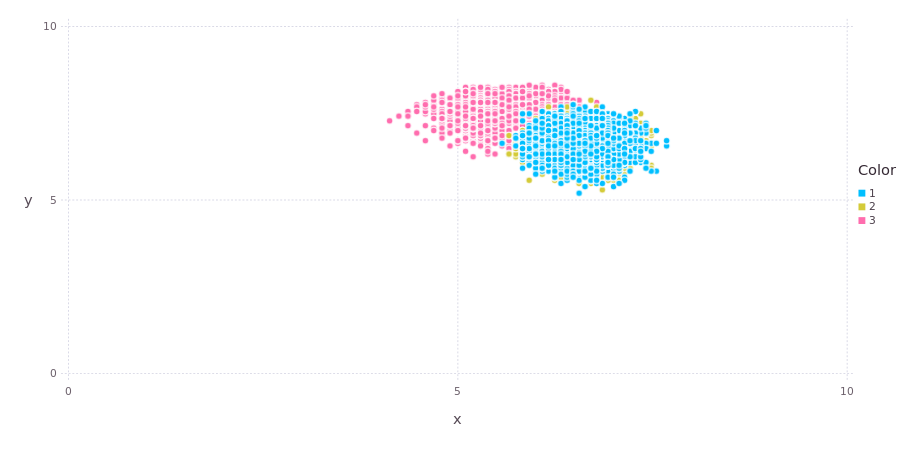

In [17]:
plothalf(dataset)

In [18]:
function plothalf_multi(dataset)
    masks = halfmasks(dataset.features)
    
    g = Array(Plot, 0)
    
    for k=1:dataset.groups
        kdata = data(dataset, k)
        x, y, _ = reduce2d(kdata, masks)
        p = plot(x=x, y=y, Scale.x_continuous(minvalue=0, maxvalue=10), Scale.y_continuous(minvalue=0, maxvalue=10))
        push!(g, p)

    end
    
    hstack(g...)
end

plothalf_multi (generic function with 1 method)

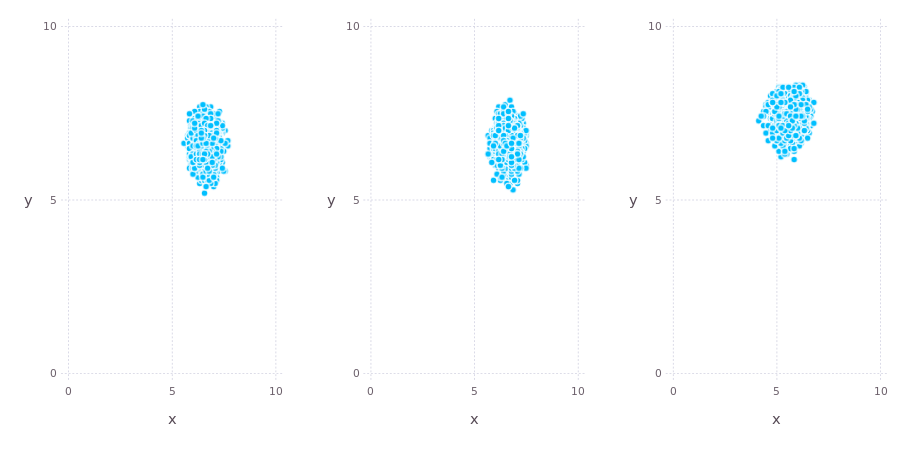

In [19]:
plothalf_multi(dataset)

In [20]:
function featuremask(features, slot, k)
    first = (k - 1) * slot + 1
    last = k * slot
    mask = zeros(features)
    mask[first:last] = 1
    mask
end

featuremask(10, 3, 1)

10-element Array{Float64,1}:
 1.0
 1.0
 1.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [21]:
function featuremasks(features, slot, k)
    kmask = featuremask(features, slot, k)
    rmask = reversemask(kmask)
    (kmask, rmask)
end

let a = rand(10),
    masks = featuremasks(10, 3, 2)
    (masks[1] .* a, masks[2] .* a)
end

([0.0,0.0,0.0,0.8305380233378967,0.5804985340433819,0.08521995780263114,0.0,0.0,0.0,0.0],[0.976353888477572,0.1938631179780701,0.12535023132695366,0.0,0.0,0.0,0.15217998395928012,0.3814806860638864,0.40509318798202343,0.014922035410868562])

In [22]:
function plotslot(dataset)
    g = Array(Layer, 0)
    
    for k=1:dataset.groups
        masks = featuremasks(dataset.features, dataset.slot, k)
        kdata = data(dataset, k)
        x, y, color = reduce2d(kdata, masks)
        push!(g, layer(x=x, y=y, color=color, Geom.point)...)
    end
    
    plot(g, Scale.x_continuous(minvalue=0, maxvalue=10), Scale.y_continuous(minvalue=0, maxvalue=10))
end

plotslot (generic function with 1 method)

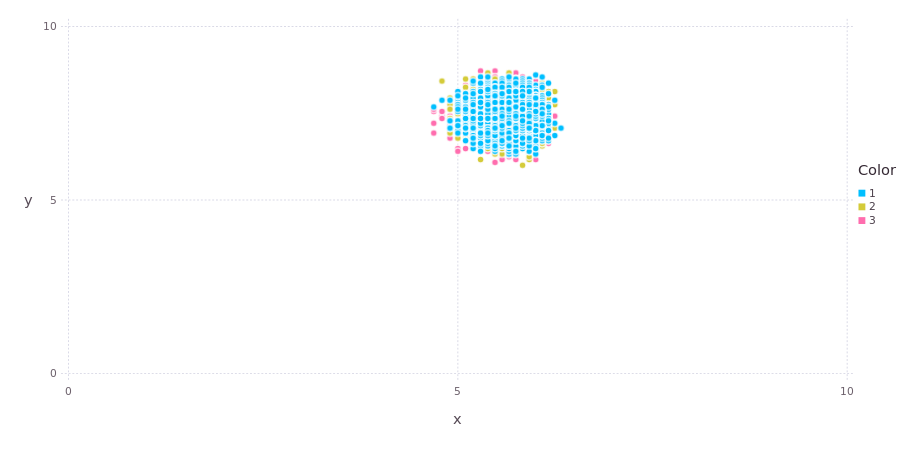

In [23]:
plotslot(dataset)

In [24]:
function plotslot_multi(dataset)
    g = Array(Plot, 0)
    
    for k=1:dataset.groups
        masks = featuremasks(dataset.features, dataset.slot, k)
        kdata = data(dataset, k)
        x, y, _ = reduce2d(kdata, masks)
        p = plot(x=x, y=y, Scale.x_continuous(minvalue=0, maxvalue=10), Scale.y_continuous(minvalue=0, maxvalue=10))
        push!(g, p)
    end
    
    hstack(g...)
end

plotslot_multi (generic function with 1 method)

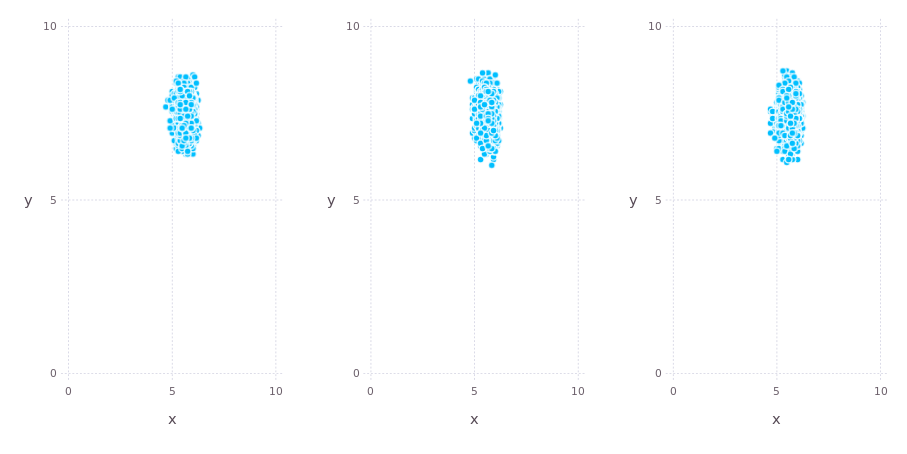

In [25]:
plotslot_multi(dataset)

### MultivariateStats Package

https://github.com/JuliaStats/MultivariateStats.jl

http://multivariatestatsjl.readthedocs.org/en/latest/index.html

A Julia package for multivariate statistics and data analysis (e.g. dimension reduction)

#### Principal Component Analysis (PCA)

http://multivariatestatsjl.readthedocs.org/en/latest/pca.html

In [26]:
if Pkg.installed("MultivariateStats") === nothing
    println("Installing MultivariateStats...")
    Pkg.add("MultivariateStats")
    Pkg.checkout("MultivariateStats")
end

In [27]:
vector_matrix(data) = float(hcat(map(first, data)...))

vector_matrix([([1,2], 1), ([3,4], 2), ([5,6], 3)])

2x3 Array{Float64,2}:
 1.0  3.0  5.0
 2.0  4.0  6.0

In [28]:
using MultivariateStats

In [29]:
let
    train = vector_matrix(dataset.data)
    fit(PCA, train; maxoutdim=2)
end

PCA(indim = 200, outdim = 2, principalratio = 0.20104)

In [30]:
let
    train = vector_matrix(dataset.data)
    model = fit(PCA, train; maxoutdim=2)
    
    sample = data(dataset, 1)
    transform(model, vector_matrix(sample))
end

2x3865 Array{Float64,2}:
 -2.89184   -2.95035  -2.87545  -2.53466   …  -3.14331   -1.97699  -2.96632 
  0.609167   1.84961   1.30105   0.344365      0.578681   1.30936   0.971145

In [31]:
let train = vector_matrix(dataset.data),
    model = fit(PCA, train; maxoutdim=2)
    
    sample = data(dataset, 1)
    points = transform(model, vector_matrix(sample))
    vec(points[1,:])
end

3865-element Array{Float64,1}:
 -2.89184
 -2.95035
 -2.87545
 -2.53466
 -2.88149
 -3.1258 
 -3.38502
 -2.99567
 -2.87573
 -2.74684
 -2.97735
 -2.55135
 -3.27007
  ⋮      
 -2.48708
 -3.03857
 -2.7929 
 -2.89622
 -2.83793
 -2.15544
 -2.50063
 -2.54383
 -2.78561
 -3.14331
 -1.97699
 -2.96632

In [32]:
function plotpca(dataset)
    train = vector_matrix(dataset.data)
    model = fit(PCA, train; maxoutdim=2)
    
    g = Array(Layer, 0)
    
    for k=1:dataset.groups
        kdata = data(dataset, k)
        kpoints = transform(model, vector_matrix(kdata))
        x = vec(kpoints[1,:])
        y = vec(kpoints[2,:])
        color = fill(string(k), size(kpoints, 2))
        push!(g, layer(x=x, y=y, color=color, Geom.point)...)
    end
    
    plot(g)
end

plotpca (generic function with 1 method)

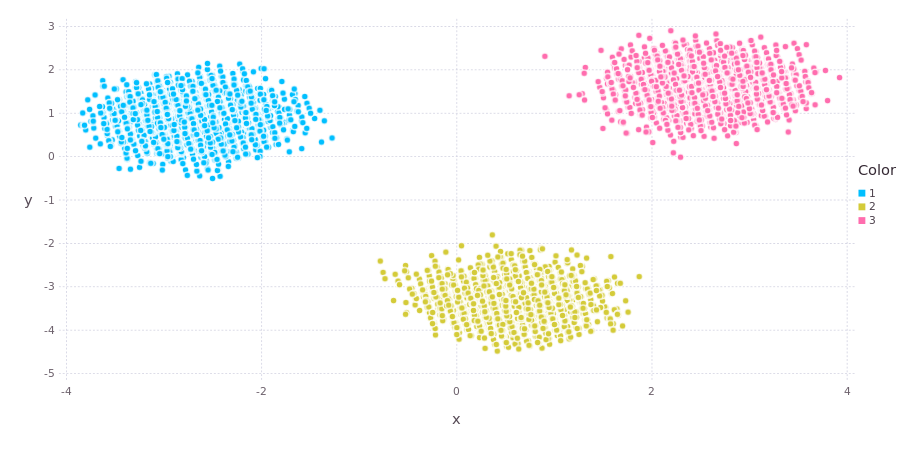

In [33]:
plotpca(dataset)

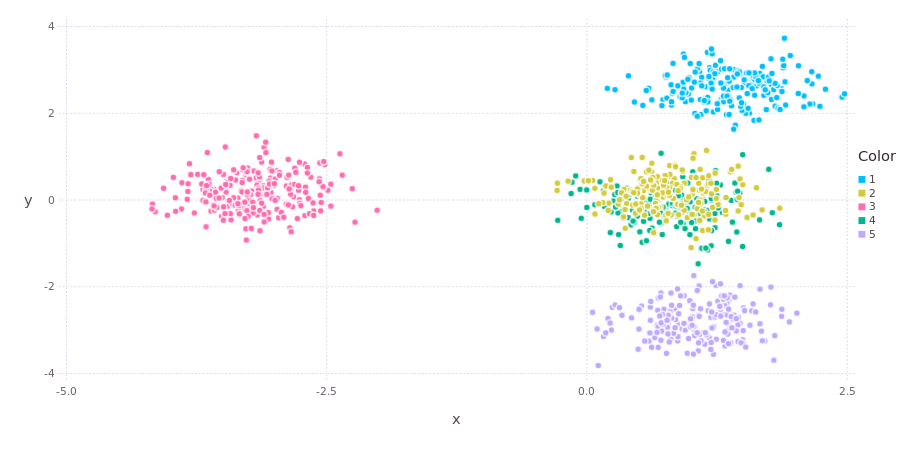

In [34]:
let _dataset = Dataset(groups=5, size=1000, features=200, slot=40)
    plotpca(_dataset)
end

## 3. Evaluation

In [35]:
function distribution(dataset)
    groups = Array(Float64, dataset.groups)
    size = 0
    for k=1:dataset.groups
        size += count(dataset, k)
        groups[k] = size
    end
    groups /= size
    groups
end

distribution(dataset)

3-element Array{Float64,1}:
 0.3865
 0.6559
 1.0   

In [36]:
function choosek(distribution)
    r = rand()
    for k=1:length(distribution)
        if r <= distribution[k]
            return k
        end
    end
    return 0
end

let
    d = [0.3, 0.5, 1.0]
    k = zeros(d)
    n = 100000
    for _=1:n
        i = choosek(d)
        k[i] += 1
    end
    k / n
end

3-element Array{Float64,1}:
 0.29924
 0.1981 
 0.50266

In [37]:
function random_clustering(dataset)
    cdf = distribution(dataset)
    clusters = Array(Int, length(dataset.data))
    for i=1:length(clusters)
        clusters[i] = choosek(cdf)
    end
    clusters
end

random_clustering(dataset)

10000-element Array{Int64,1}:
 1
 2
 3
 3
 3
 3
 3
 3
 3
 1
 2
 2
 2
 ⋮
 3
 3
 2
 3
 1
 1
 1
 3
 3
 1
 1
 1

### Confusion Matrix

https://en.wikipedia.org/wiki/Confusion_matrix

In [38]:
function confusion_matrix(dataset, prediction)
    matrix = zeros(Int, dataset.groups, dataset.groups)
    for p=1:length(prediction)
        i = dataset.data[p][2]
        j = prediction[p]
        matrix[i,j] += 1
    end
    matrix
end

let
    prediction = random_clustering(dataset)
    confusion_matrix(dataset, prediction)
end

3x3 Array{Int64,2}:
 1464  1042  1359
 1017   760   917
 1336   928  1177

In [39]:
confusion_matrix(dataset, map(t -> t[2], dataset.data))

3x3 Array{Int64,2}:
 3865     0     0
    0  2694     0
    0     0  3441

In [40]:
prediction = random_clustering(dataset)
matrix = confusion_matrix(dataset, prediction)
println(matrix, "\n")
sleep(0.2)

[1517 1000 1348
 1040 737 917
 1312 932 1197]



In [41]:
let
    n = sum(matrix)
    println("Size: ", n)
    
    trace = diag(matrix)
    println("Trace:\n", trace)
    
    x = sum(trace)

    println("Correct: ", x)
    
    o = n - x

    println("Mistakes: ", o)

    acc = x / n
    
    println("Accuracy: ", round(100 * acc, 2), "%")
    
    k = 3
    kn = sum(matrix[k,:])
    println(k, " - Size: ", kn)

    ktp = matrix[k,k]
    ktpp = ktp / kn

    println(k, " - True Positive: ", ktp, ", ", round(100 * ktpp, 2), "%")

    kfn = kn - ktp
    kfnp = kfn / o

    println(k, " - False Negative: ", kfn, ", ", round(100 * kfnp, 2), "% (errors)")

    kfp = sum(matrix[:,k]) - ktp
    kfpp = kfp / o

    println(k, " - False Positive: ", kfp, ", ", round(100 * kfpp, 2), "% (errors)")

    ktn = n - kfn - kfp - ktp
    ktnp = ktn / (n - kn)
    
    println(k, " - True Negative: ", ktn, ", ", round(100 * ktnp, 2), "%")

    kacc = (ktp + ktn) / n
    
    println(k, " - Accuracy: ", round(100 * kacc, 2), "%")

    kprecision = ktp / (ktp + kfp)

    println(k, " - Precision: ", round(100 * kprecision, 2), "%")
    
    krecall = ktp / (ktp + kfn)

    println(k, " - Recall: ", round(100 * krecall, 2), "%")
    
    kfscore = 2 * kprecision * krecall / (kprecision + krecall)

    println(k, " - F1-score: ", round(kfscore, 2))
    
    sleep(0.2)
end


Size: 10000
Trace:
[1517,737,1197]
Correct: 3451
Mistakes: 6549
Accuracy: 34.51%
3 - Size: 3441
3 - True Positive: 1197, 34.79%
3 - False Negative: 2244, 34.26% (errors)
3 - False Positive: 2265, 34.59% (errors)
3 - True Negative: 4294, 65.47%
3 - Accuracy: 54.91%
3 - Precision: 34.58%
3 - Recall: 34.79%
3 - F1-score: 0.35


In [42]:
immutable SampleEvaluation
    size::Int
    correct::Int
    mistakes::Int
    accuracy::Float64
end

immutable ClusterEvaluation
    cluster::Int
    size::Int
    
    truePositive::Int
    truePositiveShare::Float64
    trueNegative::Int
    trueNegativeShare::Float64
    
    falseNegative::Int
    falseNegativeShare::Float64
    falsePositive::Int
    falsePositiveShare::Float64
    
    precision::Float64
    recall::Float64
    fscore::Float64
    accuracy::Float64
end

immutable Evaluation
    matrix::Array{Int, 2}
    sample::SampleEvaluation
    clusters::Array{ClusterEvaluation, 1}
end

In [43]:
function SampleEvaluation(matrix)
    size = sum(matrix)
    correct = sum(diag(matrix))
    mistakes = size - correct
    accuracy = correct / size
    
    SampleEvaluation(size, correct, mistakes, accuracy)
end

function ClusterEvaluation(matrix, s, k)
    kn = sum(matrix[k,:])
    
    ktp = matrix[k,k]
    ktpp = ktp / kn
    
    kfn = kn - ktp
    kfnp = kfn / s.mistakes
    
    kfp = sum(matrix[:,k]) - ktp
    kfpp = kfp / s.mistakes
    
    ktn = s.size - kfn - kfp - ktp
    ktnp = ktn / (s.size - kn)
    
    kacc = (ktp + ktn) / s.size
    kprecision = ktp / (ktp + kfp)
    krecall = ktp / (ktp + kfn)
    kfscore = 2 * kprecision * krecall / (kprecision + krecall)

    ClusterEvaluation(k, kn, ktp, ktpp, ktn, ktnp, kfn, kfnp, kfp, kfpp, kprecision, krecall, kfscore, kacc)
end
    
function Evaluation(dataset, prediction)
    matrix = confusion_matrix(dataset, prediction)
    s = SampleEvaluation(matrix)
    c = map(k -> ClusterEvaluation(matrix, s, k), 1:dataset.groups)
    Evaluation(matrix, s, c)
end

function Base.show(io::IO, s::SampleEvaluation)
    println(io, "Size: ", s.size)
    println(io, "Correct: ", s.correct)
    println(io, "Mistakes: ", s.mistakes)
    println(io, "Accuracy: ", round(100 * s.accuracy, 2), "%")
end

function Base.show(io::IO, c::ClusterEvaluation)
    println(io, "Cluster ", c.cluster)
    println(io)
    println(io, "Size: ", c.size)
    println(io, "Accuracy: ", round(100 * c.accuracy, 2), "%")
    println(io, "Precision: ", round(100 * c.precision, 2), "%")
    println(io, "Recall: ", round(100 * c.recall, 2), "%")
    println(io, "F-score: ", round(c.fscore , 2))
    println(io)
    println(io, "True Positive: ", c.truePositive, " (", round(100 * c.truePositiveShare, 2), "%)")
    println(io, "True Negative: ", c.trueNegative, " (", round(100 * c.trueNegativeShare, 2), "%)")
    println(io, "False Negative: ", c.falseNegative, " (", round(100 * c.falseNegativeShare, 2), "%)")
    println(io, "False Positive: ", c.falsePositive, " (", round(100 * c.falsePositiveShare, 2), "%)")
end

function Base.show(io::IO, r::Evaluation)
    println(io, r.sample)
    for k in r.clusters 
        println(io, k)
    end
end

function evaluation_summary(io::IO, dataset, prediction; verbose=false)
    r = Evaluation(dataset, prediction)
    verbose && println(io, "Confusion Matrix:\n\n", r.matrix, "\n")
    print(io, r)
end

evaluation_summary(dataset, prediction; verbose=false) = evaluation_summary(STDOUT, dataset, prediction; verbose=verbose)

let
    prediction = random_clustering(dataset)
    evaluation_summary(dataset, prediction, verbose=true)
    sleep(0.2)
end

Confusion Matrix:

[1449 1069 1347
 1035 703 956
 1317 940 1184]

Size: 10000
Correct: 3336
Mistakes: 6664
Accuracy: 33.36%

Cluster 1

Size: 3865
Accuracy: 52.32%
Precision: 38.12%
Recall: 37.49%
F-score: 0.38

True Positive: 1449 (37.49%)
True Negative: 3783 (61.66%)
False Negative: 2416 (36.25%)
False Positive: 2352 (35.29%)

Cluster 2

Size: 2694
Accuracy: 60.0%
Precision: 25.92%
Recall: 26.1%
F-score: 0.26

True Positive: 703 (26.1%)
True Negative: 5297 (72.5%)
False Negative: 1991 (29.88%)
False Positive: 2009 (30.15%)

Cluster 3

Size: 3441
Accuracy: 54.4%
Precision: 33.95%
Recall: 34.41%
F-score: 0.34

True Positive: 1184 (34.41%)
True Negative: 4256 (64.89%)
False Negative: 2257 (33.87%)
False Positive: 2303 (34.56%)



In [44]:
evaluation_summary(dataset, map(t -> t[2], dataset.data))
sleep(0.2)

Size: 10000
Correct: 10000
Mistakes: 0
Accuracy: 100.0%

Cluster 1

Size: 3865
Accuracy: 100.0%
Precision: 100.0%
Recall: 100.0%
F-score: 1.0

True Positive: 3865 (100.0%)
True Negative: 6135 (100.0%)
False Negative: 0 (NaN%)
False Positive: 0 (NaN%)

Cluster 2

Size: 2694
Accuracy: 100.0%
Precision: 100.0%
Recall: 100.0%
F-score: 1.0

True Positive: 2694 (100.0%)
True Negative: 7306 (100.0%)
False Negative: 0 (NaN%)
False Positive: 0 (NaN%)

Cluster 3

Size: 3441
Accuracy: 100.0%
Precision: 100.0%
Recall: 100.0%
F-score: 1.0

True Positive: 3441 (100.0%)
True Negative: 6559 (100.0%)
False Negative: 0 (NaN%)
False Positive: 0 (NaN%)



In [45]:
let
    n = 100
    k = 3
    c = 16
    c_y = 3

    tiny = Dataset(size=n, groups=k, features=c, slot=c_y)
    summary(tiny)

    assignments = map(t -> rand() <= 0.7 ? k - t[2] + 1 : rand(1:k), tiny.data)

    centermap = zeros(Int, k)
    groups = map(v -> v[2], tiny.data)
    for i=1:k
        g_index = findin(groups, i)
        centers = map(i -> assignments[i], g_index)
        counts = hist(centers, 0:k)[2]
        center_key = indmax(counts)
        if centermap[center_key] != 0
            error("Center already mapped: $(center_key) -> $(centermap[center_key]), now $i?")
        end
        centermap[center_key] = i
    end
    println(collect(enumerate(centermap)))
    sleep(0.2)
end

Number of Groups: 3
Number of Features: 16
Number of Features (group): 3
Probability of Activation: 0.8
Number of Objects (total): 100
Number of Objects per Group (min): 20
Number of Objects per Group (max): 40
Number of Objects in 1: 26
Number of Objects in 2: 36
Number of Objects in 3: 38
[(1,3),(2,2),(3,1)]


In [46]:
function mapping(dataset, assignments, k)
    centermap = zeros(Int, k)
    groups = map(v -> v[2], dataset.data)
    for i=1:dataset.groups
        g_index = findin(groups, i)
        centers = map(i -> assignments[i], g_index)
        counts = hist(centers, 0:k)[2]
        center_key = indmax(counts)
        if centermap[center_key] != 0
            error("Center already mapped: $(center_key) -> $(centermap[center_key]), now $i?")
        end
        centermap[center_key] = i
    end
    centermap
end

let
    assignments = map(t -> rand() <= 0.7 ? dataset.groups - t[2] + 1 : rand(1:dataset.groups), dataset.data)
    centermap = mapping(dataset, assignments, dataset.groups)
    collect(enumerate(centermap))
end

3-element Array{Tuple{Int64,Int64},1}:
 (1,3)
 (2,2)
 (3,1)

## 4. Export / Load

### JLD

https://github.com/JuliaLang/JLD.jl

Saving and loading julia variables while preserving native types

In [47]:
if Pkg.installed("JLD") === nothing
    println("Installing JLD...")
    Pkg.add("JLD")
end

In [48]:
using JLD

In [49]:
save("dataset.jld", "large", dataset)

In [50]:
stat("dataset.jld")

StatStruct(mode=100664, size=23790496)

In [51]:
let ds = load("dataset.jld", "large")
    summary(ds)
    sleep(0.2)
end

Number of Groups: 3
Number of Features: 200
Number of Features (group): 40
Probability of Activation: 0.8
Number of Objects (total): 10000
Number of Objects per Group (min): 2000
Number of Objects per Group (max): 4000
Number of Objects in 1: 3865
Number of Objects in 2: 2694
Number of Objects in 3: 3441


In [52]:
rm("dataset.jld")

In [53]:
function export_dataset(name, dataset)
    path = "../dataset/" * name
    isdir(path) && rm(path, recursive=true)
    mkdir(path)
    open(path * "/summary.txt", "w") do f
        summary(f, dataset)
    end
    open(path * "/baseline.txt", "w") do f
        prediction = random_clustering(dataset)
        evaluation_summary(f, dataset, prediction)
    end
    save(path * "/dataset.jld", "dataset", dataset)
    draw(PNG(path * "/plothalf.png", 24cm, 16cm), plothalf(dataset))
    draw(PNG(path * "/plothalf_multi.png", 24cm, 16cm), plothalf_multi(dataset))
    draw(PNG(path * "/plotslot.png", 24cm, 16cm), plotslot(dataset))
    draw(PNG(path * "/plotslot_multi.png", 24cm, 16cm), plotslot_multi(dataset))
    draw(PNG(path * "/plotpca.png", 24cm, 16cm), plotpca(dataset))
end

export_dataset("test", dataset)
readdir("../dataset/test")

8-element Array{ByteString,1}:
 "baseline.txt"      
 "dataset.jld"       
 "plothalf_multi.png"
 "plothalf.png"      
 "plotpca.png"       
 "plotslot_multi.png"
 "plotslot.png"      
 "summary.txt"       

In [54]:
function load_dataset(name)
    path = "../dataset/" * name
    load(path * "/dataset.jld", "dataset")
end

load_dataset("test")

Dataset(3,200,40,0.8,10000,2000,4000,[([0,0,0,0,0,0,1,0,0,1  …  1,1,0,1,0,1,1,1,0,0],3),([1,1,1,0,1,1,1,1,1,1  …  0,1,1,1,0,1,1,0,0,1],1),([1,0,1,1,1,1,0,1,1,1  …  0,1,1,0,0,0,0,1,1,1],1),([1,0,0,1,1,1,1,1,1,1  …  0,0,0,0,0,1,0,0,1,1],1),([0,0,0,0,0,0,0,0,0,0  …  1,0,1,1,1,1,0,0,1,0],2),([1,1,1,0,1,0,0,0,1,1  …  0,1,0,0,1,1,0,0,1,1],1),([0,1,0,0,0,0,0,0,0,0  …  1,1,0,0,1,1,1,1,1,0],3),([1,0,1,0,0,1,0,0,1,1  …  0,1,1,1,0,1,0,1,1,0],3),([0,0,1,1,1,0,0,0,0,0  …  0,1,0,1,0,1,0,0,1,1],3),([0,0,0,0,0,1,0,0,1,0  …  0,0,1,1,1,1,1,1,0,0],2)  …  ([0,0,0,1,0,0,0,0,0,0  …  0,1,0,0,0,0,1,1,0,0],3),([0,0,0,0,0,0,0,0,0,0  …  1,0,0,0,1,0,1,0,0,1],3),([0,0,0,0,0,0,1,0,0,0  …  0,0,1,0,0,0,0,0,1,0],2),([0,0,0,0,0,0,1,0,0,1  …  0,0,0,0,0,1,1,0,1,0],2),([0,1,1,0,1,0,0,0,0,0  …  0,0,1,0,0,0,1,1,1,1],2),([1,1,0,1,1,1,1,0,1,1  …  1,0,0,0,1,1,0,0,1,0],1),([1,1,1,1,0,1,1,1,1,0  …  0,1,1,0,1,1,1,1,1,1],1),([0,0,0,0,1,0,0,1,1,0  …  1,0,0,0,1,0,1,0,1,0],3),([0,0,0,0,0,0,0,1,0,0  …  0,0,0,0,0,0,1,0,0,0],2),([0,0,0,

In [55]:
rm("../dataset/test", recursive=true)